In [5]:
import torch
from torchvision import transforms
import rasterio
import numpy as np
from torchgeo.models import resnet50
import matplotlib.pyplot as plt
from datetime import datetime
import pandas as pd
import os
# Create the pre-trained ResNet50 model using torchgeo

model = resnet50(weights=None, num_classes=0, in_chans=2)
checkpoint = torch.load('models/B2_moco_rn50_0099_ckpt.pth', map_location='cpu')
model.load_state_dict(checkpoint, strict=False)
model.eval()



C:\Users\2012m\AppData\Local\Temp\ipykernel_5840\2311221428.py:13: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load('models/B2_moco_rn50_0099_ckpt.pth',

ResNet(
  (conv1): Conv2d(2, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (act1): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (act1): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (drop_block): Identity()
      (act2): ReLU(inplace=True)
      (aa): Identity()
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
     

In [6]:
S1_MEAN = [-12.54847273, -20.19237134]
S1_STD = [5.25697717, 5.91150917]

def normalize(img, mean, std):
    min_value = mean - 2 * std
    max_value = mean + 2 * std
    img = (img - min_value) / (max_value - min_value) * 255.0

    sar_band1 = img.squeeze()
    low, high = np.percentile(sar_band1, [1, 99])
    sar_band1_clipped = np.clip(sar_band1, low, high)
    sar_band1_norm = (sar_band1_clipped - low) / (high - low)

    return sar_band1_norm


def process_sentinel_image(img_path):
    # Transformations for the image
    preprocess = transforms.Compose([
        transforms.Resize(224),
        transforms.CenterCrop(224),  
        transforms.Lambda(lambda x: x )
    ])
 
    with rasterio.open(img_path) as src:
        img = src.read([1, 2])  
        MEAN = S1_MEAN
        STD = S1_STD
        for i in range(img.shape[0]):
            img[i] = normalize(img[i], MEAN[i], STD[i])
            #img[i] = img[i]


    img_tensor = torch.tensor(img, dtype=torch.float32)

    # Convert the image to a tensor
    sentinel_image = img_tensor.unsqueeze(0)
    transformed_image = preprocess(sentinel_image)

    # Get the embedding
    with torch.no_grad():
        embedding = model(transformed_image)

    return transformed_image, embedding


In [7]:
import os

# Path to the folder with Sentinel images
data_folder = 'SENTINEL1_OUTPUT'

# Get the list of files in the folder
image_files = [f for f in os.listdir(data_folder) if f.endswith('.tiff')]

print(f'Number of images: {len(image_files)}')
print(f'First 5 images: {image_files[:5]}')

# Create a dictionary to store embeddings and transformed images
embeddings = []
transformed_images = []

# Process each image and obtain its embedding
for image_file in image_files:
    img_path = os.path.join(data_folder, image_file)
    transformed_image, embedding = process_sentinel_image(img_path)
   
    embeddings.append(embedding.squeeze().cpu().numpy())
    transformed_images.append(transformed_image.squeeze().cpu().numpy())

# Create a list of dates in YYYYMMDD format
dates_yyyymmdd = [datetime.strptime(img.split('_')[1].replace('.tiff', ''), '%Y-%m-%d') for img in image_files]

# Create a DataFrame with all the data
df = pd.DataFrame({
    'Image': image_files,
    'Date': dates_yyyymmdd,
    'Embedding': embeddings,
    'Transformed Image': transformed_images,
})



Number of images: 481
First 5 images: ['S1_2021-01-02.tiff', 'S1_2021-01-03.tiff', 'S1_2021-01-08.tiff', 'S1_2021-01-09.tiff', 'S1_2021-01-14.tiff']


In [8]:
embeddings = np.array(embeddings)
transformed_images = np.array(transformed_images)




c:\Users\2012m\Desktop\NASA\.venv\Lib\site-packages\joblib\externals\loky\backend\context.py:136: UserWarning: Could not find the number of physical cores for the following reason:
[WinError 2] El sistema no puede encontrar el archivo especificado
Returning the number of logical cores instead. You can silence this warning by setting LOKY_MAX_CPU_COUNT to the number of cores you want to use.
  warnings.warn(
  File "c:\Users\2012m\Desktop\NASA\.venv\Lib\site-packages\joblib\externals\loky\backend\context.py", line 257, in _count_physical_cores
    cpu_info = subprocess.run(
               ^^^^^^^^^^^^^^^
  File "C:\Users\2012m\AppData\Local\Programs\Python\Python312\Lib\subprocess.py", line 548, in run
    with Popen(*popenargs, **kwargs) as process:
         ^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\2012m\AppData\Local\Programs\Python\Python312\Lib\subprocess.py", line 1026, in __init__
    self._execute_child(args, executable, preexec_fn, close_fds,
  File "C:\Users\2012m\AppData\L

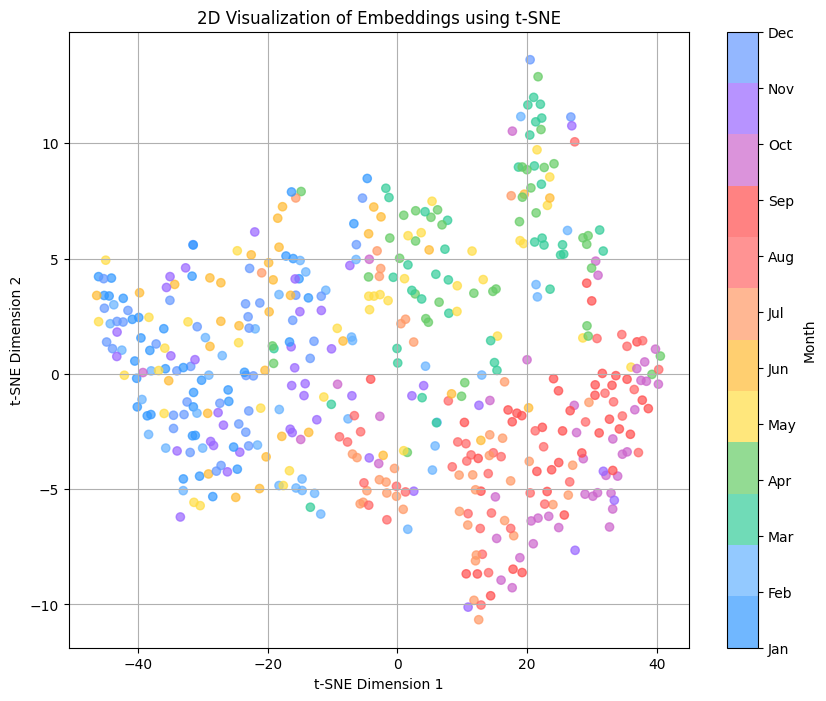

In [9]:
from sklearn.manifold import TSNE
import matplotlib.colors as mcolors

# Reduce the dimensionality of the embeddings to 2D using t-SNE
tsne = TSNE(n_components=2, random_state=42)
embeddings_2d = tsne.fit_transform(embeddings)

# Create a custom colormap
# Colors representing the average temperature of each month (from colder to warmer)
colors = [
    "#3399FF",  # January (Intense cold blue)
    "#66B2FF",  # February (Vibrant light blue)
    "#33CC99",  # March (Stronger aqua green)
    "#66CC66",  # April (Spring green)
    "#FFDD44",  # May (Warm yellow)
    "#FFBB33",  # June (Bright orange)
    "#FF9966",  # July (Reddish orange)
    "#FF6666",  # August (Soft red)
    "#FF4D4D",  # September (Stronger red)
    "#CC66CC",  # October (Autumn purple)
    "#9966FF",  # November (Cold purple)
    "#6699FF"   # December (Winter blue)
]
custom_cmap = mcolors.ListedColormap(colors)

# Convert dates to month numbers
df['Month'] = pd.to_datetime(df['Date']).dt.month

# Create the scatter plot
plt.figure(figsize=(10, 8))
scatter = plt.scatter(embeddings_2d[:, 0], embeddings_2d[:, 1], c=df['Month'], cmap=custom_cmap, alpha=0.7)

# Add month labels to each color
month_labels = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
colorbar = plt.colorbar(scatter, ticks=range(1, 13), label='Month')
colorbar.ax.set_yticklabels(month_labels)

plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')
plt.title('2D Visualization of Embeddings using t-SNE')
plt.grid(True)
plt.show()

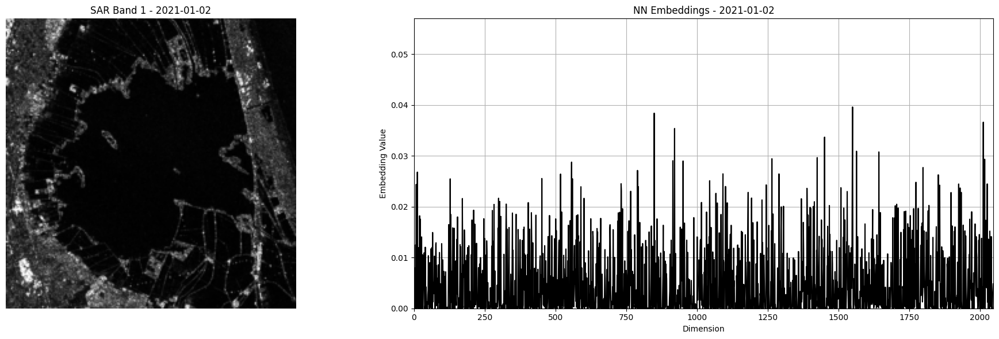

In [10]:
embedding = df['Embedding'][0]
img_path = df['Image'][0]
date_str = img_path.split('_')[1].replace('.tiff', '')  
date = datetime.strptime(date_str, '%Y-%m-%d').strftime('%Y-%m-%d')

transformed_image = df['Transformed Image'][0]

fig, ax = plt.subplots(1, 2, figsize=(20, 6))

# Plot the first band as grayscale
band1 = transformed_image[0]
ax[0].imshow(band1, cmap='gray')
ax[0].set_title(f'SAR Band 1 - {date}')
ax[0].axis('off')

# Plot the embedding
ax[1].plot(embedding, color='black')
ax[1].set_ylim([0, np.max(embeddings)])
ax[1].set_xlim([0, len(embedding)])
ax[1].set_title(f'NN Embeddings - {date}')
ax[1].set_xlabel('Dimension')
ax[1].set_ylabel('Embedding Value')
ax[1].grid(True)

plt.tight_layout()
plt.show()


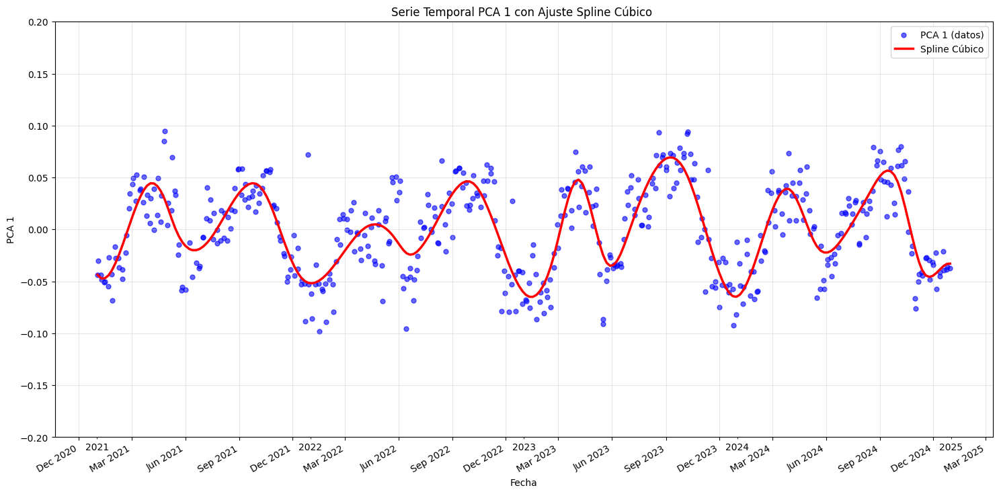

In [11]:
from scipy.interpolate import UnivariateSpline
import matplotlib.dates as mdates
from sklearn.decomposition import PCA

import matplotlib.dates as mdates

# Perform PCA on the embeddings
pca = PCA(n_components=1)
principal_components = pca.fit_transform(embeddings)

# Extract dates from the file names
dates = [datetime.strptime(img.split('_')[1].replace('.tiff', ''), '%Y-%m-%d') for img in image_files]

# Convert dates to numerical values for fitting
dates_num = mdates.date2num(dates)
y_data = principal_components.flatten()

# Crear spline cúbico con suavizado automático
# s=None permite que el algoritmo seleccione automáticamente el nivel de suavizado
spline = UnivariateSpline(dates_num, y_data, s=0.3)

# Generar valores suavizados
spline_fitted = spline(dates_num)

# Crear el gráfico de serie temporal con splines cúbicos
plt.figure(figsize=(18, 20))

# Subplot principal: datos y ajuste
plt.subplot(2, 1, 1)
plt.scatter(dates, y_data, marker='o', alpha=0.6, label='PCA 1 (datos)', color='blue', s=25)
plt.plot(dates, spline_fitted, color='red', linewidth=2.5, label='Spline Cúbico')

plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))
plt.gca().xaxis.set_minor_formatter(mdates.DateFormatter('%Y'))
plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=3))
plt.gca().xaxis.set_minor_locator(mdates.YearLocator(day=1, month=1))
plt.gcf().autofmt_xdate()

plt.xlabel('Fecha')
plt.ylabel('PCA 1')
plt.ylim([-0.2, 0.2])
plt.title(f'Serie Temporal PCA 1 con Ajuste Spline Cúbico ')
plt.grid(True, alpha=0.3)
plt.legend()




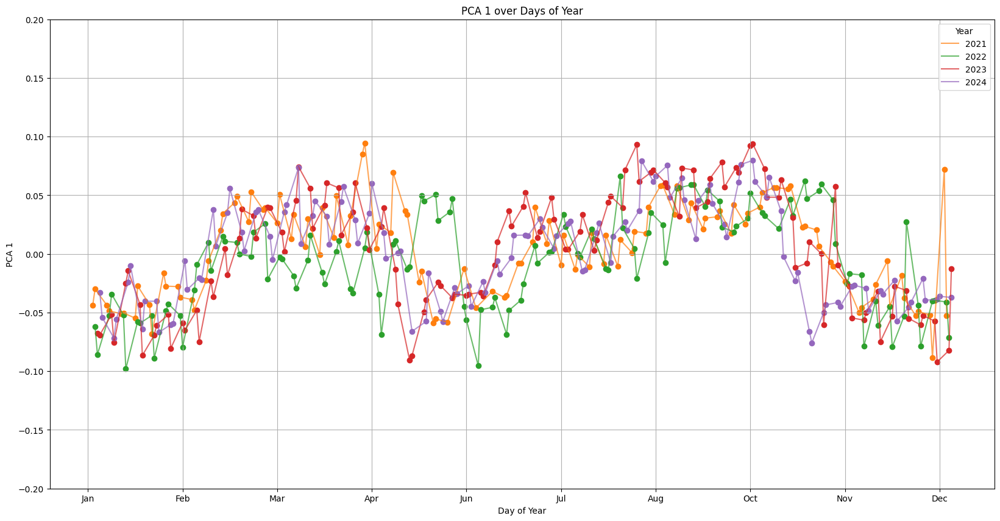

In [12]:
# Create the time series plot with days of the year on the x-axis
plt.figure(figsize=(20, 10))

# Extract the day of the year from the dates
days_of_year = [date.timetuple().tm_yday for date in dates]

# Extract the years from the dates
years = [date.year for date in dates]

# Create a colormap
cmap = plt.get_cmap('tab10')
colors = [cmap(year % 10) for year in years]

# Group data by year
unique_years = sorted(set(years))
year_to_data = {year: ([], []) for year in unique_years}

for day, pca, year in zip(days_of_year, principal_components[:len(days_of_year)], years):
    year_to_data[year][0].append(day)
    year_to_data[year][1].append(pca)

# Plot lines and scatter points for each year
for year in unique_years:
    plt.plot(year_to_data[year][0], year_to_data[year][1], color=cmap(year % 10), alpha=0.7, label=f'{year}')
    plt.scatter(year_to_data[year][0], year_to_data[year][1], color=cmap(year % 10), marker='o')

# Configure the x-axis to display all days of the year
plt.gca().xaxis.set_major_locator(plt.MaxNLocator(12))
plt.gca().xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: datetime.strptime(f'{int(max(1, min(x, 365)))}', '%j').strftime('%b')))

plt.xlabel('Day of Year')
plt.ylabel('PCA 1')
plt.ylim([-0.2, 0.2])  # Adjust the Y-axis range to [-0.5, 0.5]
plt.title('PCA 1 over Days of Year')
plt.grid(True)

# Create the legend
plt.legend(title="Year")
plt.show()

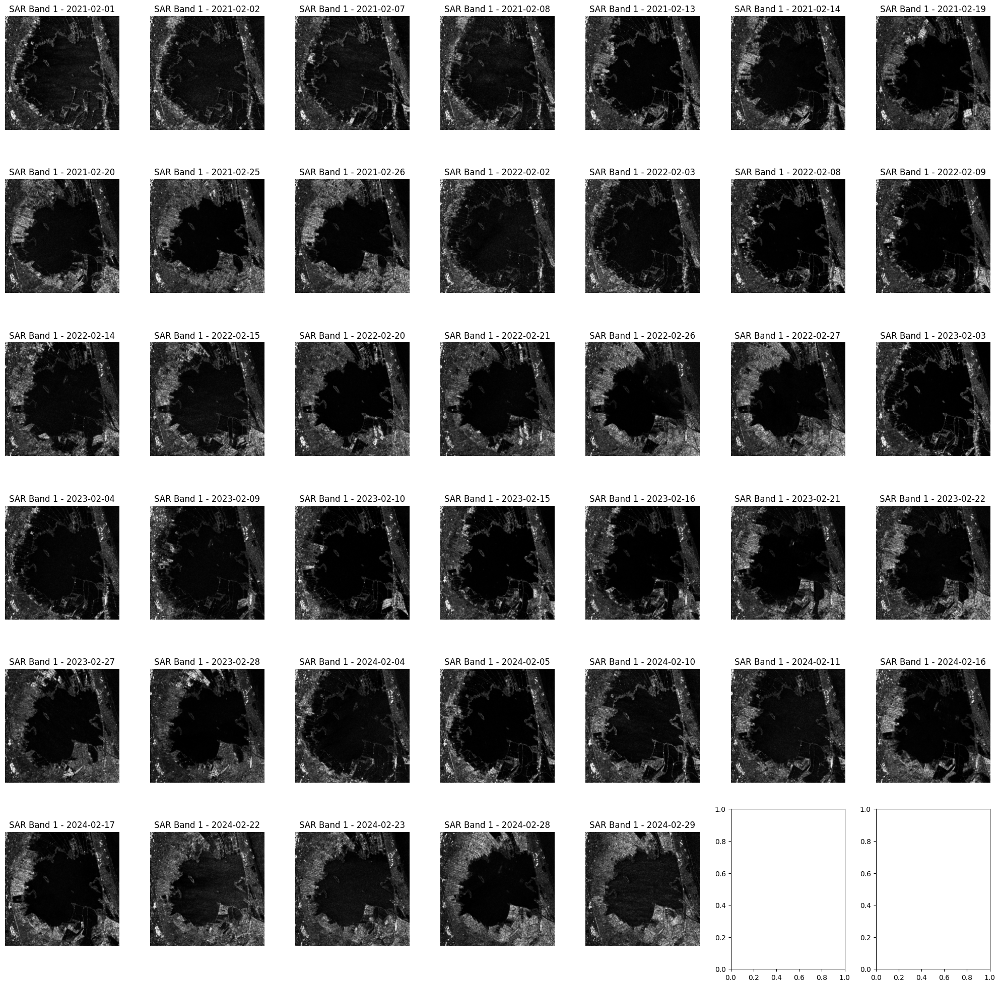

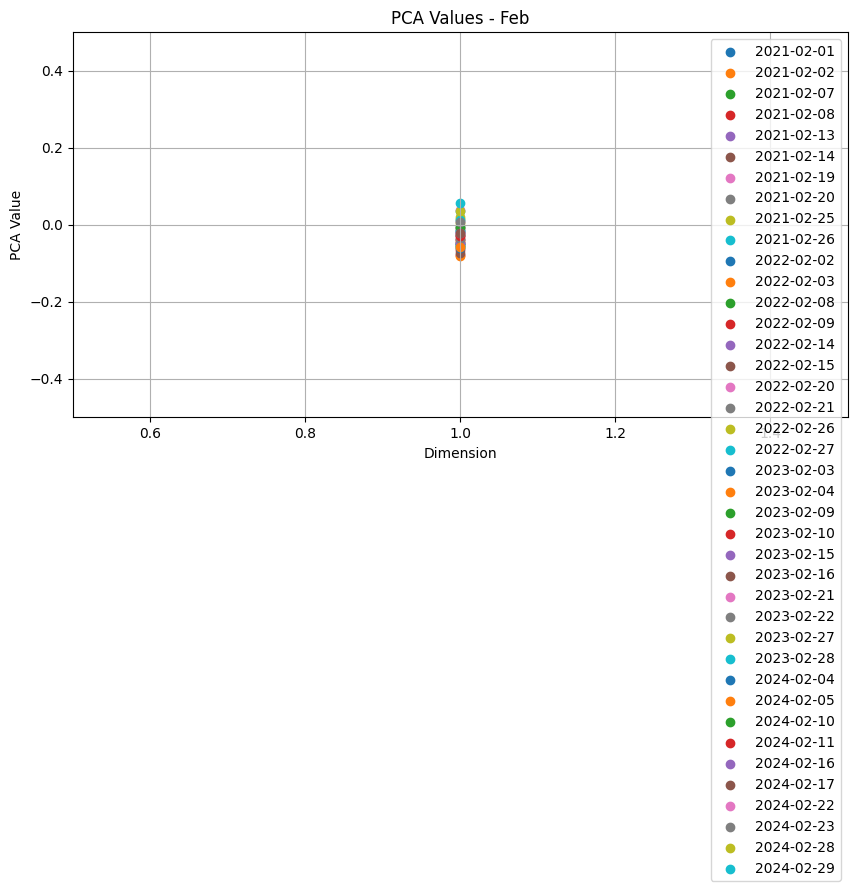

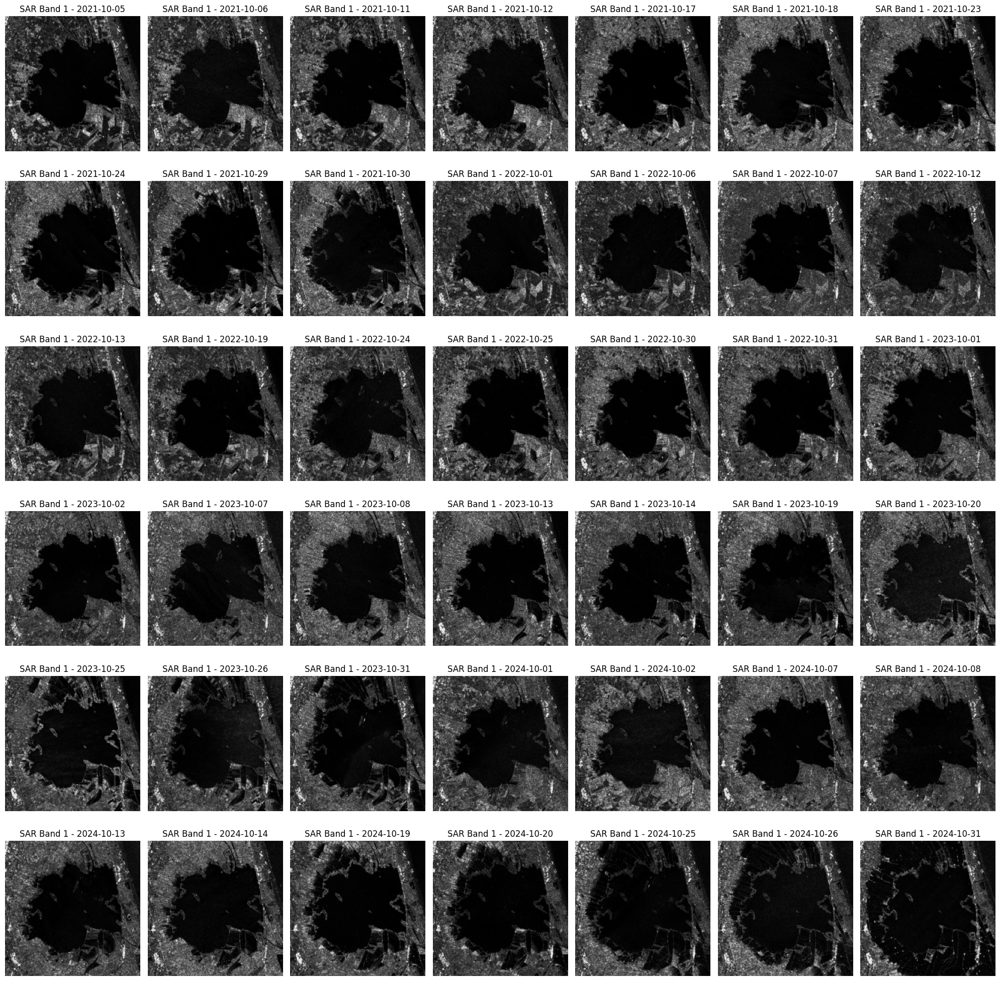

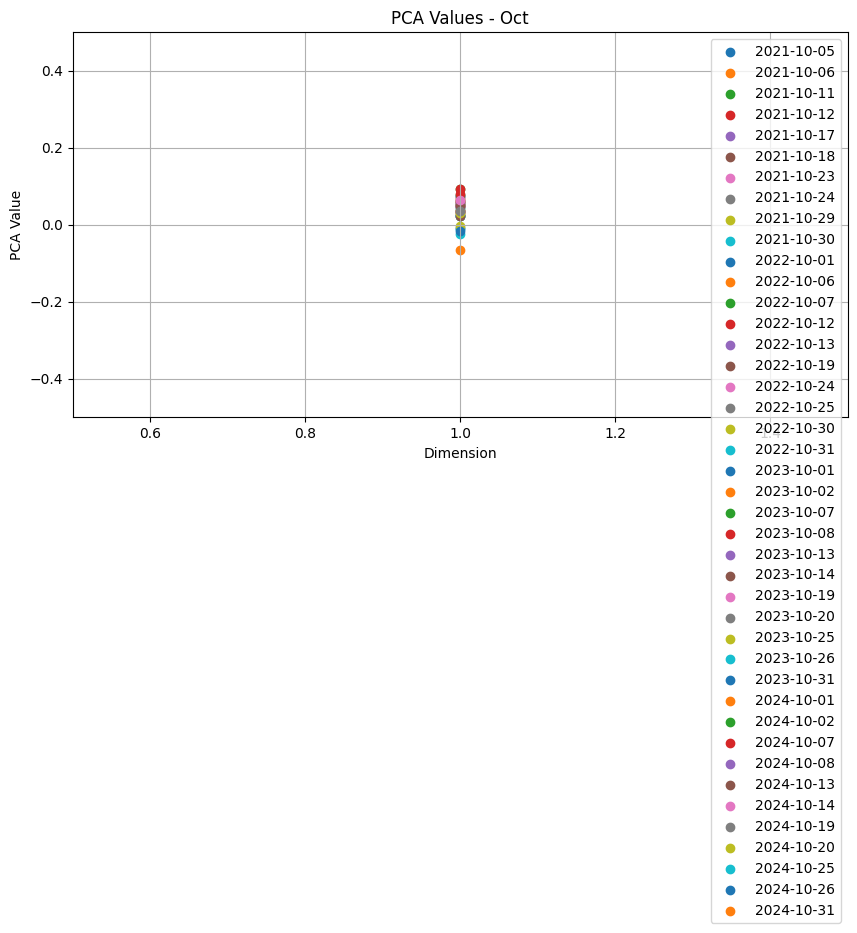

In [ ]:
import math

import matplotlib.pyplot as plt

months = [date.strftime('%b') for date in dates]

# Filter the images for February and October
feb_images = [img for img, month in zip(transformed_images, months) if month == 'Feb']
oct_images = [img for img, month in zip(transformed_images, months) if month == 'Oct']

# Filter the corresponding PCA values
feb_pca = [pca_val for pca_val, month in zip(principal_components, months) if month == 'Feb']
oct_pca = [pca_val for pca_val, month in zip(principal_components, months) if month == 'Oct']

# Save the indices of the images for February and October
feb_indices = [i for i, month in enumerate(months) if month == 'Feb']
oct_indices = [i for i, month in enumerate(months) if month == 'Oct']




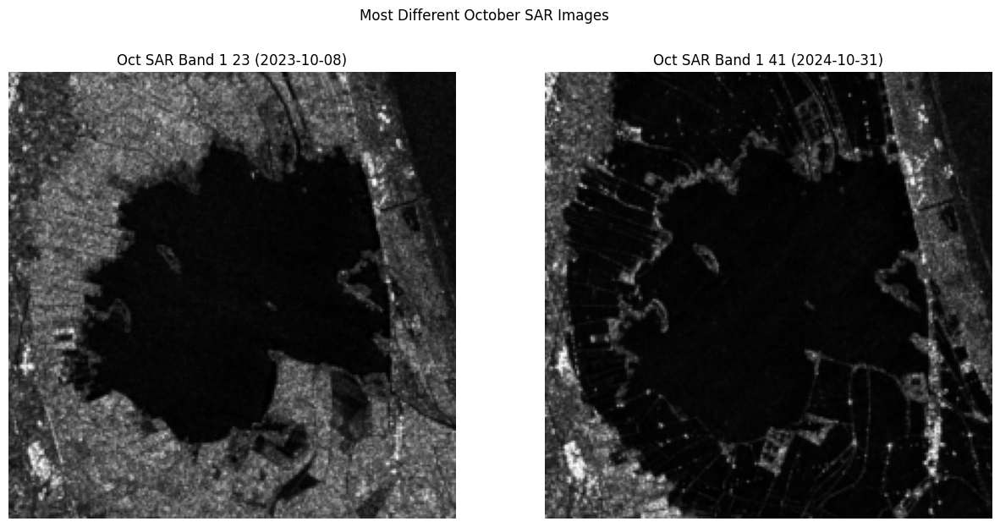

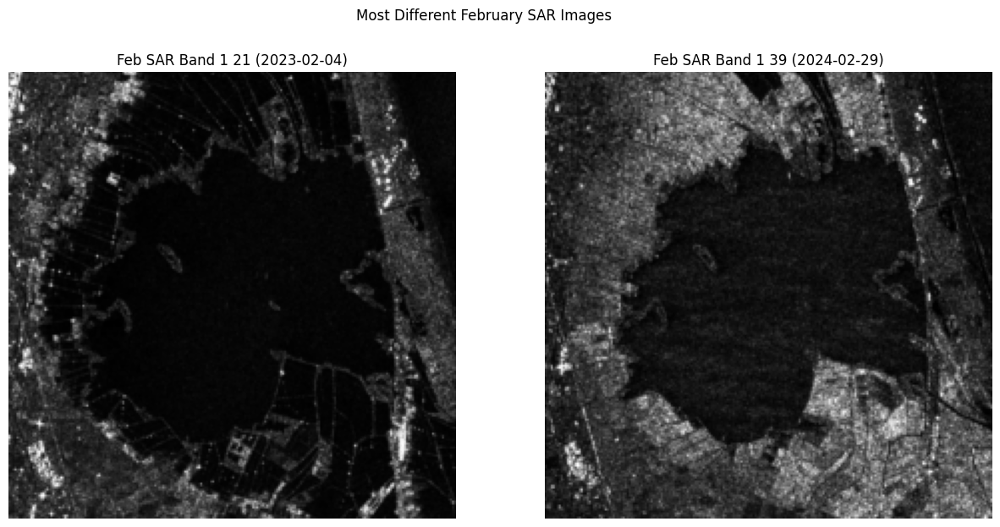

In [14]:
from scipy.spatial.distance import euclidean

# Find the two most different images for October
max_diff_oct = 0
img_pair_oct = (None, None)

for i in range(len(oct_pca)):
    for j in range(i + 1, len(oct_pca)):
        diff = euclidean(oct_pca[i], oct_pca[j])
        if diff > max_diff_oct:
            max_diff_oct = diff
            img_pair_oct = (i, j)

# Find the two most different images for February
max_diff_feb = 0
img_pair_feb = (None, None)

feb_pca = [principal_components[idx] for idx in feb_indices]
for i in range(len(feb_pca)):
    for j in range(i + 1, len(feb_pca)):
        diff = euclidean(feb_pca[i], feb_pca[j])
        if diff > max_diff_feb:
            max_diff_feb = diff
            img_pair_feb = (i, j)

# Display the most different SAR images for October
fig, axes = plt.subplots(1, 2, figsize=(15, 7))
for idx, ax in zip(img_pair_oct, axes):
    # SAR Band 1
    sar_band1 = oct_images[idx][0]
    date = dates[oct_indices[idx]].strftime('%Y-%m-%d')
    ax.imshow(sar_band1, cmap='gray')
    ax.axis('off')
    ax.set_title(f'Oct SAR Band 1 {idx} ({date})')
plt.suptitle('Most Different October SAR Images')
plt.show()

# Display the most different SAR images for February
if img_pair_feb[0] is not None and img_pair_feb[1] is not None:
    fig, axes = plt.subplots(1, 2, figsize=(15, 7))
    for idx, ax in zip(img_pair_feb, axes):
        sar_band1 = feb_images[idx][0]
        date = dates[feb_indices[idx]].strftime('%Y-%m-%d')
        ax.imshow(sar_band1, cmap='gray')
        ax.axis('off')
        ax.set_title(f'Feb SAR Band 1 {idx} ({date})')
    plt.suptitle('Most Different February SAR Images')
    plt.show()
else:
    print("No valid pair of most different February images found.")


In [15]:
# Create a temporary folder to store the images
tmpdir = "plots"

if not os.path.exists(tmpdir):
    os.makedirs(tmpdir)

try:
    image_paths = []

    for i, embedding in enumerate(embeddings):
        fig, ax = plt.subplots(1, 3, figsize=(24, 6))

        img_path = image_files[i]
        date_str = img_path.split('_')[1].replace('.tiff', '')  
        date = datetime.strptime(date_str, '%Y-%m-%d').strftime('%Y-%m-%d')
        
        transformed_image = transformed_images[i]  # shape: (2, H, W)

        # Plot SAR Band 1
        ax[0].imshow(transformed_image[0], cmap='gray')
        ax[0].set_title(f'SAR Band 1 - {date}')
        ax[0].axis('off')

        # Plot SAR Band 2
        ax[1].imshow(transformed_image[1], cmap='gray')
        ax[1].set_title(f'SAR Band 2 - {date}')
        ax[1].axis('off')

        # Plot the embedding
        ax[2].plot(embedding, color='black')
        ax[2].set_ylim([0, np.max(embeddings)])
        ax[2].set_xlim([0, len(embedding)])
        ax[2].set_title(f'NN Embeddings - {date}')
        ax[2].set_xlabel('Dimension')
        ax[2].set_ylabel('Embedding Value')
        ax[2].grid(True)

        plt.tight_layout()
        image_path = f'{tmpdir}/plot_{date}.png'
        plt.savefig(image_path)
        image_paths.append(image_path)
        plt.close()    

finally:
    print("Plots created")

Plots created


In [16]:
import cv2
import os

image_folder = 'plots'
video_name = 'SENTINEL2-VALENCIA.mp4'

images = [img for img in os.listdir(image_folder) if img.endswith(".png")]
frame = cv2.imread(os.path.join(image_folder, images[0]))
height, width, layers = frame.shape

video = cv2.VideoWriter(video_name, 0, 10, (width,height))

for image in images:
    video.write(cv2.imread(os.path.join(image_folder, image)))

cv2.destroyAllWindows()
video.release()

In [17]:
img_path = r"C:\Users\2012m\Desktop\NASA\SENTINEL1_OUTPUT\S1_2024-10-01.tiff"
import rasterio
import matplotlib.pyplot as plt


with rasterio.open(img_path) as src:
        img = src.read([1, 2])  
        MEAN = S1_MEAN
        STD = S1_STD
        for i in range(img.shape[0]):
            img[i] = normalize(img[i], MEAN[i], STD[i])

        bounds = src.bounds
        print("Bounds:", bounds)
        # Convert first band to PNG and save
        band1 = img[0]
        # Normalize for visualization
        band1_norm = (band1 - band1.min()) / (band1.max() - band1.min())
        plt.imsave("S1_2024-10-01_band1.png", band1_norm, cmap='gray')
        print("PNG saved as S1_2024-10-01_band1.png")

Bounds: BoundingBox(left=-0.407625, bottom=39.292975, right=-0.305073, top=39.375418)
PNG saved as S1_2024-10-01_band1.png
